In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('final_df.csv', encoding='utf-8')
df.head()

,id,listing_url,last_scraped,name,description,neighborhood_overview,host_id,host_name,host_since,host_location,...,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_shared,date,reviewer_id,reviewer_name,comments,all_comments,desc_words,host_words
0,5456,https://www.airbnb.com/rooms/5456,2023-06-04,Guesthouse in Austin · ★4.84 · 1 bedroom · 2 b...,Great central location for walking to Convent...,My neighborhood is ideally located if you want...,8028.0,Sylvia,2009-02-16 00:00:00,"Austin, TX",...,0.0,3.73,f,2009-03-08,5267.0,Ellen,Sylvia is a hostess who is gracious and helpfu...,Sylvia is a hostess who is gracious and helpfu...,"['great', 'central', 'location', 'walking', 'c...","['licensed', 'real', 'estate', 'broker', 'owne..."
1,5769,https://www.airbnb.com/rooms/5769,2023-06-03,Home in Austin · ★4.90 · 1 bedroom · 1 bed · 1...,<b>The space</b><br />Looking for a comfortabl...,Quiet neighborhood with lots of trees and good...,8186.0,Elizabeth,2009-02-19 00:00:00,"Austin, TX",...,0.0,1.78,t,2010-04-10,79506.0,Maris,Elizabeth was really nice and friendly. She he...,Elizabeth was really nice and friendly. She he...,"['b', 'space', '/b', 'br', 'looking', 'comfort...","[""'re"", 'easygoing', 'professionals', 'enjoy',..."
2,6413,https://www.airbnb.com/rooms/6413,2022-10-17,Gem of a Studio near Downtown,"Great studio apartment, perfect a single perso...",Travis Heights is one of the oldest neighborho...,13879.0,Todd,2009-04-17 00:00:00,"Austin, TX",...,0.0,0.76,f,2009-12-14,57646.0,Chris & Adriana,"Had a wonderful time at this awesome, spacious...","Had a wonderful time at this awesome, spacious...","['great', 'studio', 'apartment', 'perfect', 's...","[""'re"", 'young', 'family', 'likes', 'travel', ..."
3,6448,https://www.airbnb.com/rooms/6448,2023-05-16,Guesthouse in Austin · ★4.97 · 1 bedroom · 2 b...,"Clean, private space with everything you need ...",The neighborhood is fun and funky (but quiet)!...,14156.0,Amy,2009-04-20 00:00:00,"Austin, TX",...,0.0,2.12,f,2011-09-06,1099569.0,Kristina,Amy and family were wonderful hosts! The house...,Amy and family were wonderful hosts! The house...,"['clean', 'private', 'space', 'everything', 'n...","['family', 'four', 'teenagers', 'us', 'vaccina..."
4,8502,https://www.airbnb.com/rooms/8502,2023-05-16,Guest suite in Austin · ★4.56 · 1 bedroom · 1 ...,Studio rental on lower level of home located i...,No info entered,25298.0,Karen,2009-07-11 00:00:00,"Austin, TX",...,0.0,0.31,f,2010-02-19,78239.0,T.J.,"The place was nice, it was like a disco in the...","The place was nice, it was like a disco in the...","['studio', 'rental', 'lower', 'level', 'home',...","['handle', 'reservations', 'studio', 'lower', ..."


In [4]:
df['bathroom_shared'] = df['bathroom_shared'].replace('t', 1).replace('f', 0)

In [5]:
df['host_is_superhost'] =df['host_is_superhost'].replace('t', 1).replace('f', 0).replace('No info entered', 0).replace('Private room in townhouse', 0).replace('Entire condo', 0)

In [9]:
# Select numerical columns
numerical_columns = df.select_dtypes(include=['number']).columns

# Select object type (string) columns
object_columns = df.select_dtypes(include=['object']).columns

# Print the lists of column names
print("Numerical Columns:", numerical_columns)
print("Object Type Columns:", object_columns)

Numerical Columns: Index(['host_id', 'host_response_rate', 'host_total_listings_count',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'accommodates',
       'beds', 'price', 'minimum_nights', 'maximum_nights', 'availability_365',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_location',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month',
       'bathroom_shared', 'reviewer_id'],
      dtype='object')
Object Type Columns: Index(['id', 'listing_url', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_acceptance_rate',
       'host_is_superhost', 'host_neighbourhood', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood', 'property_type', 'room_type',
       'bathrooms_text', 'bedrooms', 'amenities', 'has_availability',
       'number_of_reviews', 'first_review', '

## Reviews are overall high - over 4.5

In [10]:
df['review_scores_rating'].describe()

count    13569.000000
mean         4.771881
std          0.532760
min          0.000000
25%          4.750000
50%          4.930000
75%          5.000000
max          5.000000
Name: review_scores_rating, dtype: float64

#### setting the review range

In [11]:
import pandas as pd


# Assuming 'df' is your DataFrame
# Define the bin edges and labels
bins = [0, 4.5, 4.8, 4.9, 5.0, float('inf')]  # Specify the bin edges
labels = ['~4.5', '4.5~4.8', '4.8~4.9', '4.9~5.0', '5.0']  # Specify the labels for each bin

# Create the 'rating_range' column based on 'review_scores_rating'
df['rating_range'] = pd.cut(df['review_scores_rating'], bins=bins, labels=labels, right=False)


# Display the updated DataFrame
print(df[['review_scores_rating', 'rating_range']])


       review_scores_rating rating_range
0                      4.84      4.8~4.9
1                      4.90      4.9~5.0
2                      4.97      4.9~5.0
3                      4.97      4.9~5.0
4                      4.56      4.5~4.8
...                     ...          ...
13697                  5.00          5.0
13698                  5.00          5.0
13699                  5.00          5.0
13700                  5.00          5.0
13701                  5.00          5.0

[13702 rows x 2 columns]


In [12]:
df[df['review_scores_rating'] == 4.9]['rating_range'].value_counts()

4.9~5.0    273
~4.5         0
4.5~4.8      0
4.8~4.9      0
5.0          0
Name: rating_range, dtype: int64

## Price distribution

In [13]:
df['price'].describe()

count    13569.000000
mean       243.027225
std        853.088429
min          1.000000
25%         92.000000
50%        148.000000
75%        250.000000
max      90151.000000
Name: price, dtype: float64

#### setting the price range

In [14]:
import pandas as pd



# Assuming 'df' is your DataFrame
# Define the bin edges and labels
bins = [0, 90, 150, 200, 250, float('inf')]  # Specify the bin edges
labels = ['~90', '90~150', '150~200', '200~250', '250~']  # Specify the labels for each bin

# Create the 'rating_range' column based on 'review_scores_rating'
df['price_range'] = pd.cut(df['price'], bins=bins, labels=labels, right=False)

# Display the updated DataFrame
print(df[['price', 'price_range']])

       price price_range
0      107.0      90~150
1       42.0         ~90
2      109.0      90~150
3      159.0     150~200
4       48.0         ~90
...      ...         ...
13697  102.0      90~150
13698  173.0     150~200
13699   50.0         ~90
13700  124.0      90~150
13701  639.0        250~

[13702 rows x 2 columns]


# 1. By Rating Score

### Some meaningful Corrleation with rating score and number of monthly reviews:
 - 'Host_is_super_host (1 if super host)' shows some correlation with high rating and number of reviews
 - host_response_rate and host_acceptance_Rate shows high correlatino with number of monthly reviews

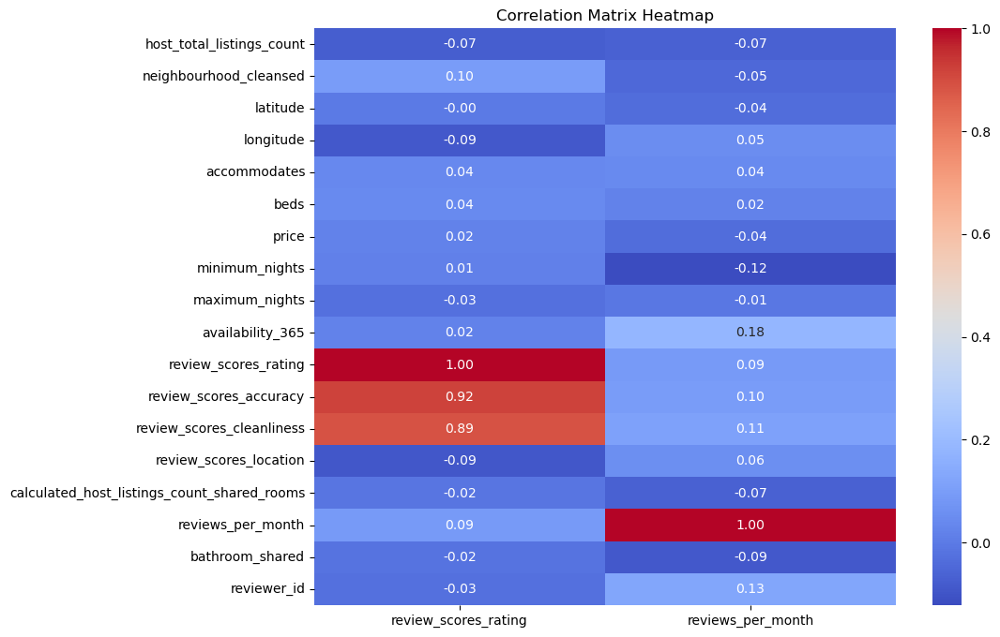

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have already defined your DataFrame and numerical_columns

# Compute the correlation matrix
correlation_matrix = df[numerical_columns].iloc[:, 2:].corr()[['review_scores_rating', 'reviews_per_month']]

# Create a heatmap
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

In [21]:
df.groupby('property_type')['review_scores_rating'].mean().sort_values(ascending=False)

property_type
Tipi                            5.000000
Room in bed and breakfast       5.000000
Private room in earthen home    5.000000
Ranch                           4.985000
Room in aparthotel              4.980000
                                  ...   
Private room in rental unit     4.493786
Shared room in home             4.463462
Shared room in townhouse        4.000000
Private room                    3.900000
t                               0.500000
Name: review_scores_rating, Length: 70, dtype: float64

In [22]:
df.groupby('room_type')['review_scores_rating'].mean().sort_values(ascending=False)

room_type
Hotel room         4.800000
Entire home/apt    4.780151
Private room       4.739609
Shared room        4.561158
0                  1.000000
42                 0.000000
Name: review_scores_rating, dtype: float64

<AxesSubplot:title={'center':'number of properties by rating range'}, xlabel='rating_range'>

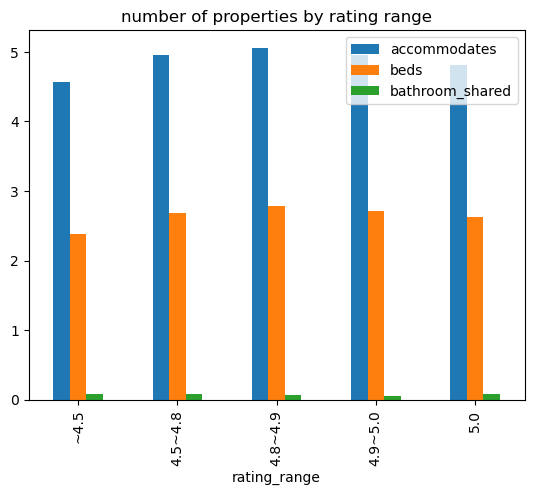

In [23]:
df.groupby('rating_range')[['accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'bathroom_shared']].mean().plot(kind='bar', title = 'number of properties by rating range')

<AxesSubplot:title={'center':'avilability_365 by rating_range'}, xlabel='rating_range'>

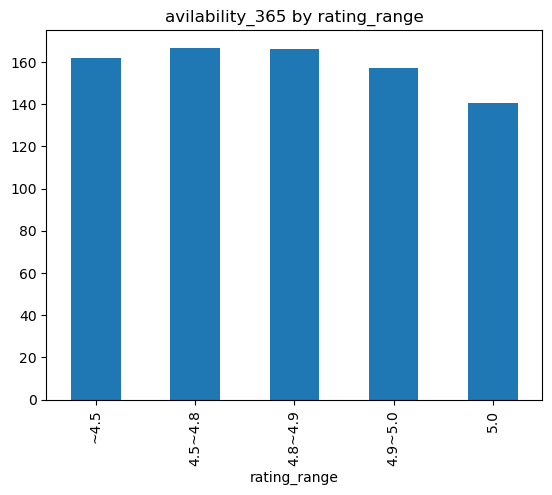

In [24]:
df.groupby(['rating_range'])['availability_365'].mean().plot(kind='bar', title='avilability_365 by rating_range')

#### by price range

<AxesSubplot:title={'center':'avilability_365 by price_range'}, xlabel='price_range'>

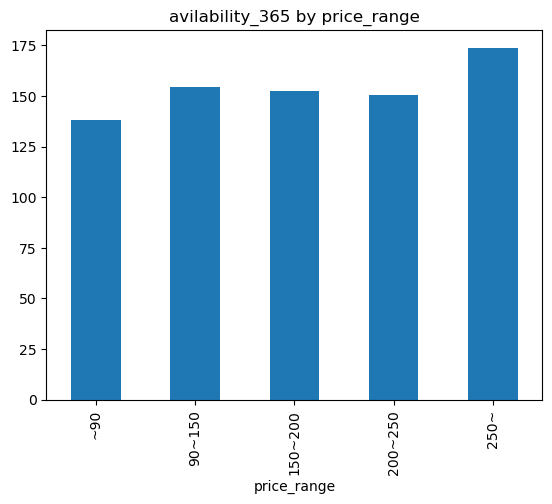

In [25]:
df.groupby(['price_range'])['availability_365'].mean().plot(kind='bar', title='avilability_365 by price_range')

/var/folders/9m/mbcz94nd0x56sh8gf16ky2680000gn/T/ipykernel_22337/1657335315.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby('rating_range')['host_response_rate','host_acceptance_rate'].mean().plot(kind='bar', title='host response,acceptance rate by rating_range')


<AxesSubplot:title={'center':'host response,acceptance rate by rating_range'}, xlabel='rating_range'>

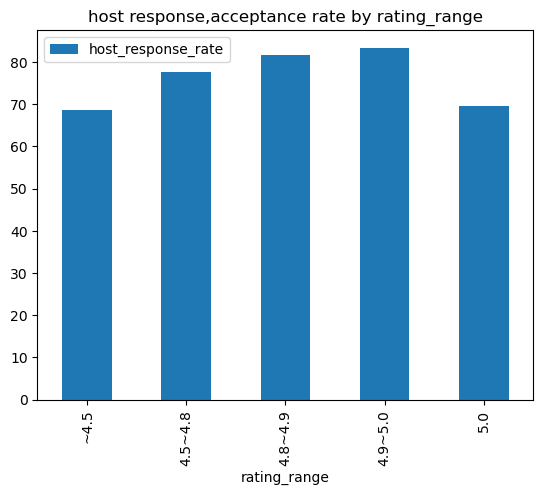

In [26]:
df.groupby('rating_range')['host_response_rate','host_acceptance_rate'].mean().plot(kind='bar', title='host response,acceptance rate by rating_range')

<AxesSubplot:title={'center':'mean price per rating_range'}, xlabel='rating_range'>

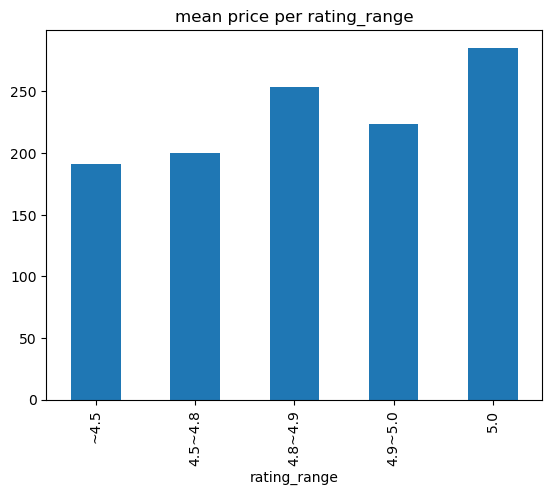

In [27]:
df.groupby('rating_range')['price'].mean().plot(kind='bar', title='mean price per rating_range')

<AxesSubplot:xlabel='rating_range'>

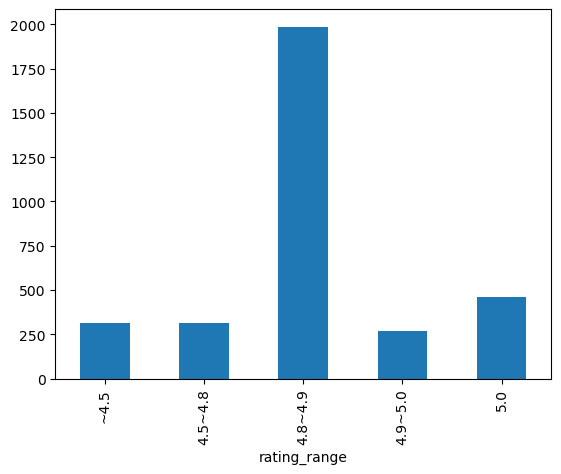

In [28]:
df.groupby('rating_range')['price'].std().plot(kind='bar')

In [29]:
df['amenities']

0        ["HDTV with Amazon Prime Video, HBO Max, Hulu,...
1        ["Host greets you", "Essentials", "Shampoo", "...
2        ["Heating", "Outdoor dining area", "Dove body ...
3        ["Essentials", "Shampoo", "Microwave", "Cleani...
4        ["Hot water", "Kitchen", "Free street parking"...
                               ...                        
13697    ["Coffee maker: drip coffee maker", "Keypad", ...
13698    ["Essentials", "Shampoo", "Microwave", "Cleani...
13699    ["Outdoor dining area", "First aid kit", "Kitc...
13700    ["Essentials", "Microwave", "Cleaning products...
13701    ["Essentials", "Shampoo", "Microwave", "Cleani...
Name: amenities, Length: 13702, dtype: object

### Most Frequent Amenities for every listing

In [30]:
import pandas as pd
from collections import Counter

def clean_and_split(amenities_string):
    # Check if the input is a string
    if isinstance(amenities_string, str):
        # Remove the leading and trailing characters (like [" and "])
        cleaned_string = amenities_string.strip('[]')
    
        # Split on ', ' and remove extra quotes
        return [amenity.strip('"') for amenity in cleaned_string.split('", "')]
    else:
        # Return an empty list or handle non-string input appropriately
        return []
    
# Apply the function to each row in the amenities column
amenities_lists = df['amenities'].apply(clean_and_split)

# Flatten the list of lists into a single list of amenities
all_amenities = [amenity for sublist in amenities_lists for amenity in sublist]

# Count occurrences of each amenity
amenities_count = Counter(all_amenities)

# Convert to DataFrame
amenities_df = pd.DataFrame(amenities_count.items(), columns=['Amenity', 'Count'])

# Sort by count for better visualization or analysis
amenities_df = amenities_df.sort_values(by='Count', ascending=False)

In [31]:
# Amenities of every listings
amenities_df['percentage'] = amenities_df['Count']/len(df)
amenities_df[amenities_df['percentage'] > 0.70]

,Amenity,Count,percentage
21,Smoke alarm,13061,0.953219
16,Kitchen,12814,0.935192
1,Essentials,12237,0.893081
9,Wifi,11942,0.871552
5,Hair dryer,10817,0.789447
12,Hangers,10814,0.789228
49,Free parking on premises,10630,0.775799
4,Dishes and silverware,10543,0.769450
58,Carbon monoxide alarm,10519,0.767698
42,Fire extinguisher,10407,0.759524


### Most Frequent Amenities for "Full points rating" listing

In [32]:
amentiy_fullpoint = df.groupby('amenities')['review_scores_rating'].mean()

amentiy_fullpoint = amentiy_fullpoint[amentiy_fullpoint==5]

amenity_fullpoint = pd.Series(amentiy_fullpoint.index)

In [33]:
import pandas as pd
from collections import Counter

# Function to clean and split the amenities string
def clean_and_split(amenities_string):
    # Remove the leading and trailing characters (like [" and "])
    cleaned_string = amenities_string.strip('[]')
    
    # Split on ', ' and remove extra quotes
    return [amenity.strip('"') for amenity in cleaned_string.split('", "')]

# Apply the function to each row in the amenities column
amenities_lists = amenity_fullpoint.apply(clean_and_split)

# Flatten the list of lists into a single list of amenities
all_amenities = [amenity for sublist in amenities_lists for amenity in sublist]

# Count occurrences of each amenity
amenities_count = Counter(all_amenities)

# Convert to DataFrame
amenities_df = pd.DataFrame(amenities_count.items(), columns=['Amenity', 'Count'])

# Sort by count for better visualization or analysis
amenities_df = amenities_df.sort_values(by='Count', ascending=False)

In [34]:
# Amenities of mean rating = 5 listings
amenities_df[:20]

,Amenity,Count
19,Smoke alarm,4512
40,Kitchen,4459
8,Wifi,4106
15,Essentials,4040
1,Free parking on premises,3716
30,Carbon monoxide alarm,3560
31,Fire extinguisher,3472
56,Hair dryer,3470
57,Hangers,3442
38,Dishes and silverware,3366


# 2. Status by Zipcode

In [35]:
df = df[df['neighbourhood_cleansed']!=35.0]
df = df[df['neighbourhood_cleansed']!=69.0 ]

<AxesSubplot:title={'center':'rating and number of reviews per month by zipcode'}, xlabel='neighbourhood_cleansed'>

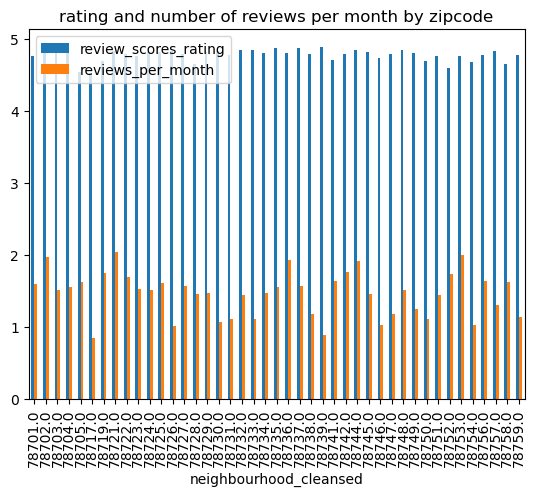

In [36]:
df.groupby('neighbourhood_cleansed')[['review_scores_rating', 'reviews_per_month']].mean().plot(kind='bar', title='rating and number of reviews per month by zipcode')

<AxesSubplot:title={'center':'average price per zipcode'}, xlabel='neighbourhood_cleansed'>

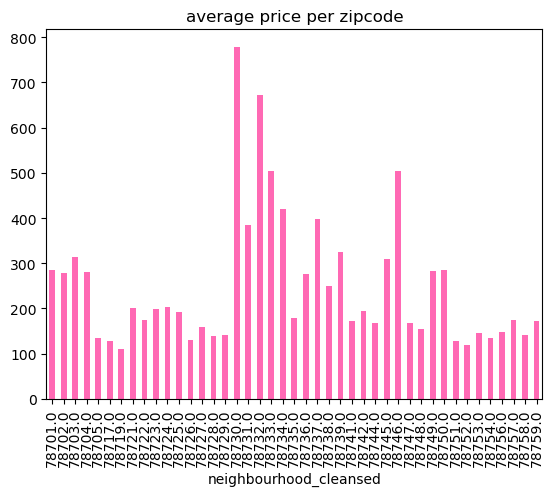

In [38]:
df.groupby('neighbourhood_cleansed')['price'].mean().plot(kind='bar',title='average price per zipcode', color='hotpink')

<AxesSubplot:title={'center':'std of price per zipcode'}, xlabel='neighbourhood_cleansed'>

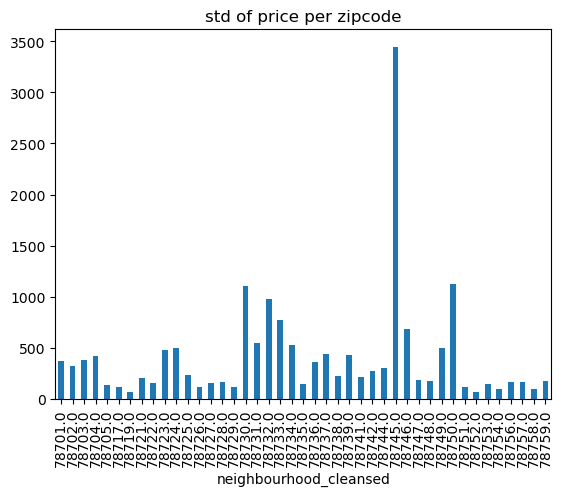

In [39]:
df.groupby('neighbourhood_cleansed')['price'].std().plot(kind='bar',title='std of price per zipcode')

<AxesSubplot:title={'center':'availability_365 by zipcode'}, xlabel='neighbourhood_cleansed'>

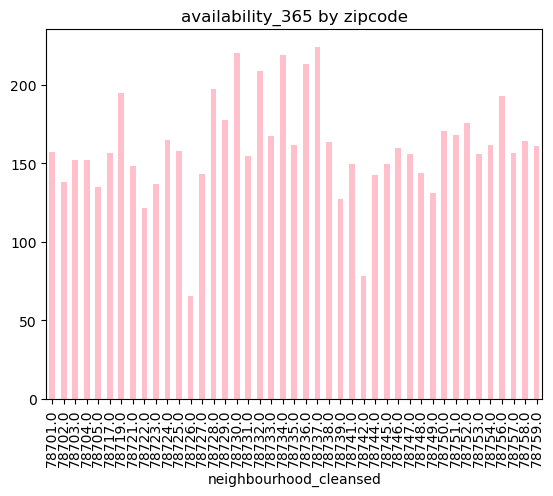

In [40]:
df.groupby('neighbourhood_cleansed')['availability_365'].mean().plot(kind= 'bar',title='availability_365 by zipcode', color='pink')

<AxesSubplot:xlabel='neighbourhood_cleansed'>

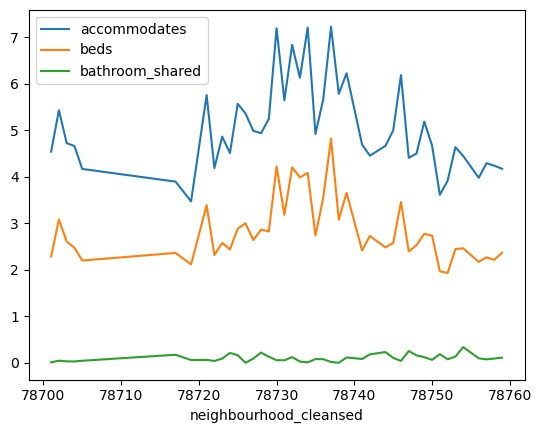

In [41]:
df.groupby('neighbourhood_cleansed')[['accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'bathroom_shared']].mean().plot()


In [42]:
df['host_is_superhost'] = df['host_is_superhost'].replace('t', 1).replace('f', 0).replace('No info entered', 0)

<AxesSubplot:title={'center':'The number of Superhosts per zipcode'}, xlabel='neighbourhood_cleansed'>

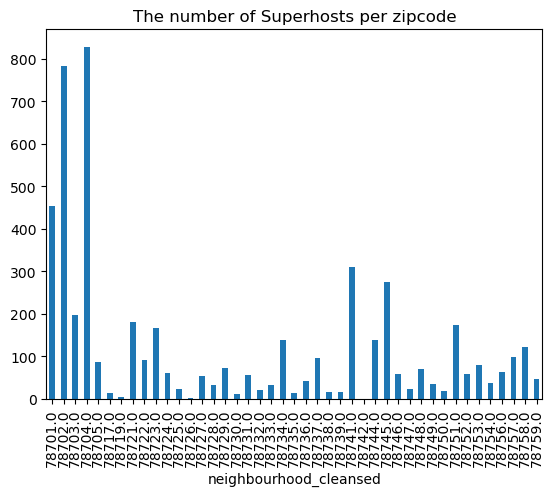

In [43]:
df.groupby('neighbourhood_cleansed')['host_is_superhost'].sum().plot(kind='bar',title='The number of Superhosts per zipcode')

<AxesSubplot:title={'center':'The percentage of Superhosts per zipcode'}, xlabel='neighbourhood_cleansed'>

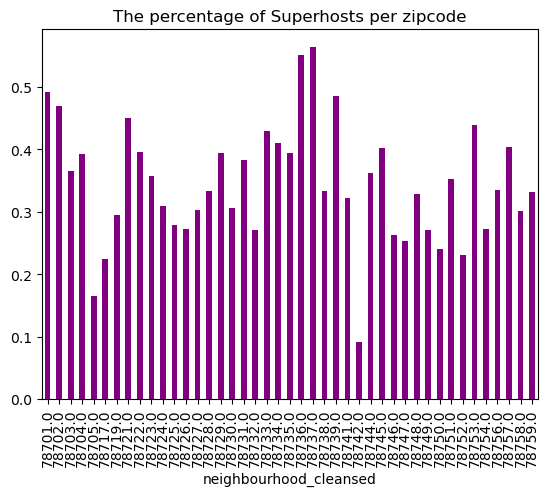

In [46]:
(df.groupby('neighbourhood_cleansed')['host_is_superhost'].sum() / df.groupby('neighbourhood_cleansed')['host_is_superhost'].count()).plot(kind='bar',title='The percentage of Superhosts per zipcode', color='purple')

<AxesSubplot:title={'center':'Mean rating per zipcode'}, xlabel='neighbourhood_cleansed'>

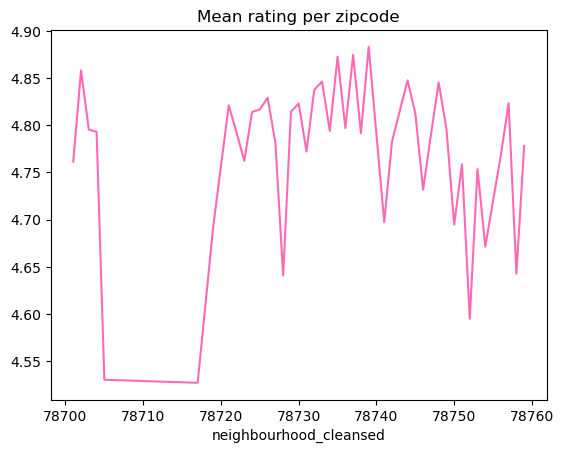

In [47]:
df.groupby('neighbourhood_cleansed')['review_scores_rating'].mean().plot(title='Mean rating per zipcode', color='hotpink')

<AxesSubplot:title={'center':'Minimum rating per zipcode'}, xlabel='neighbourhood_cleansed'>

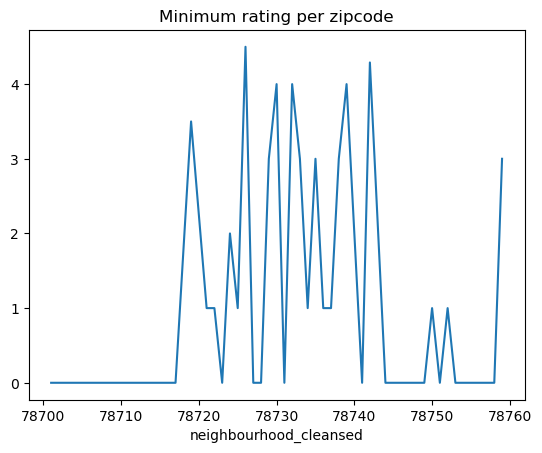

In [48]:
df.groupby('neighbourhood_cleansed')['review_scores_rating'].min().plot(title='Minimum rating per zipcode')

<AxesSubplot:title={'center':'Maximum rating per zipcode'}, xlabel='neighbourhood_cleansed'>

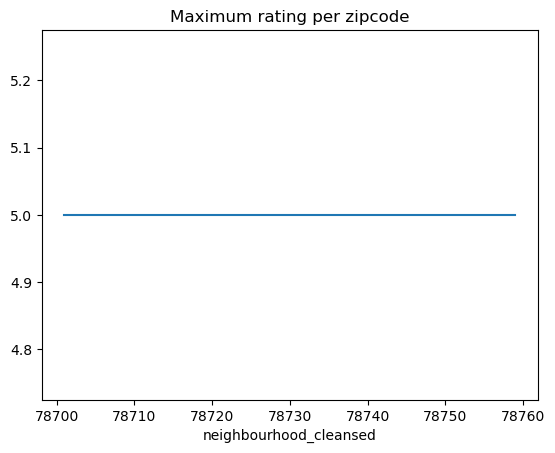

In [49]:
df.groupby('neighbourhood_cleansed')['review_scores_rating'].max().plot(title='Maximum rating per zipcode')

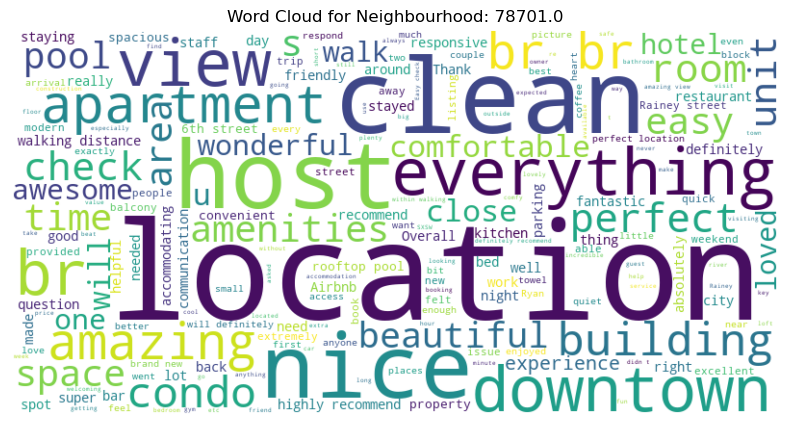

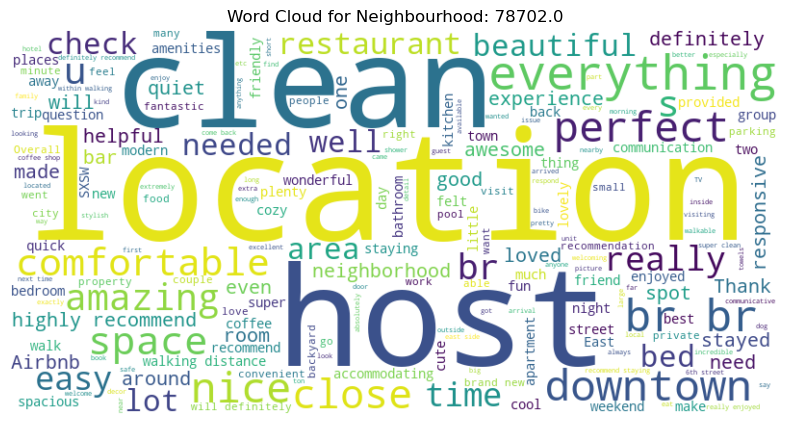

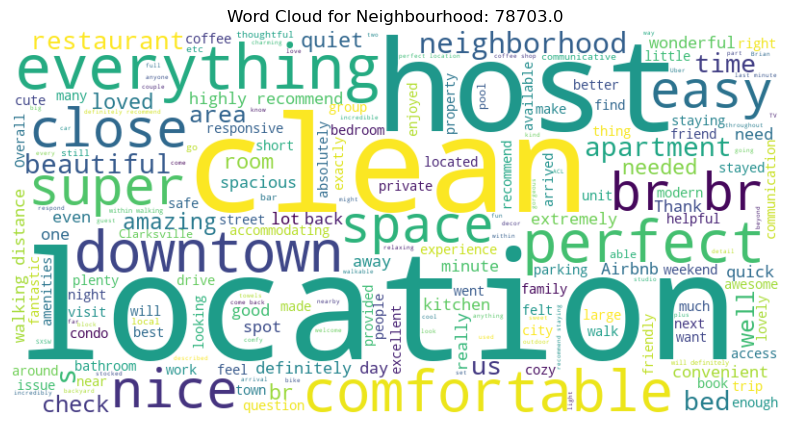

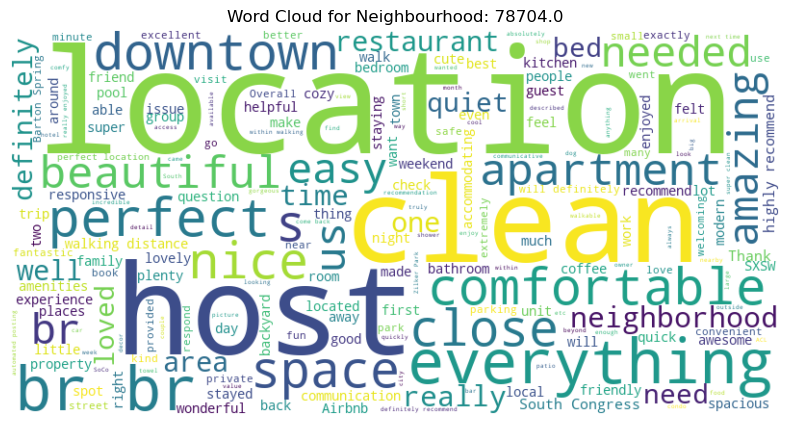

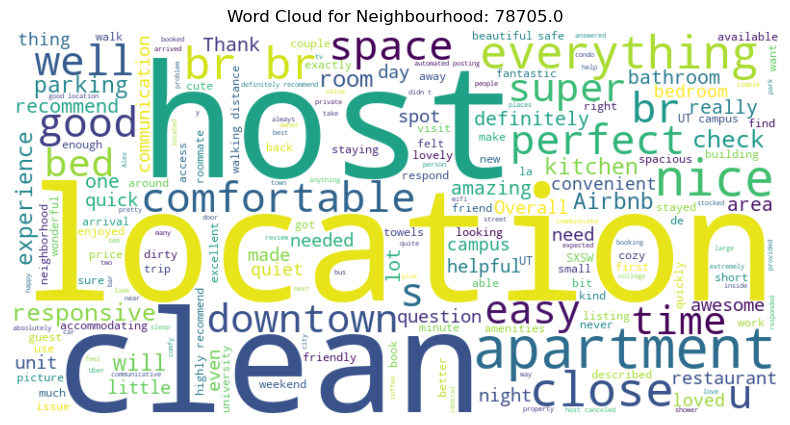

...

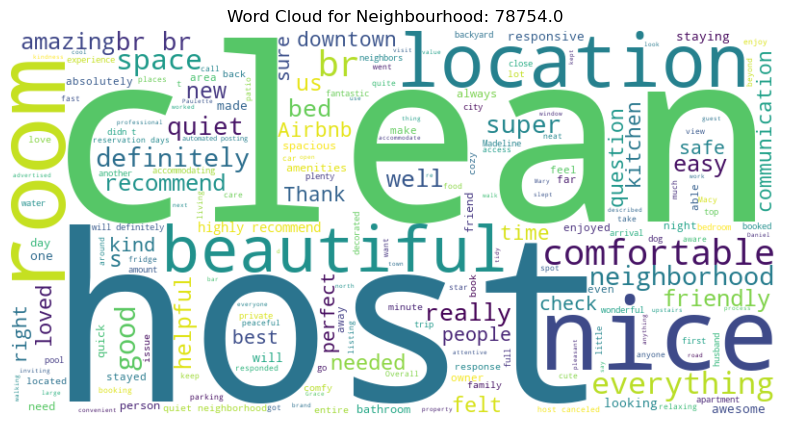

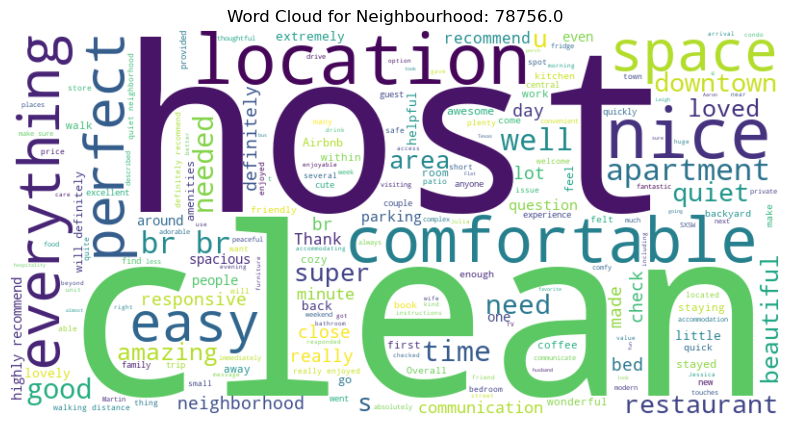

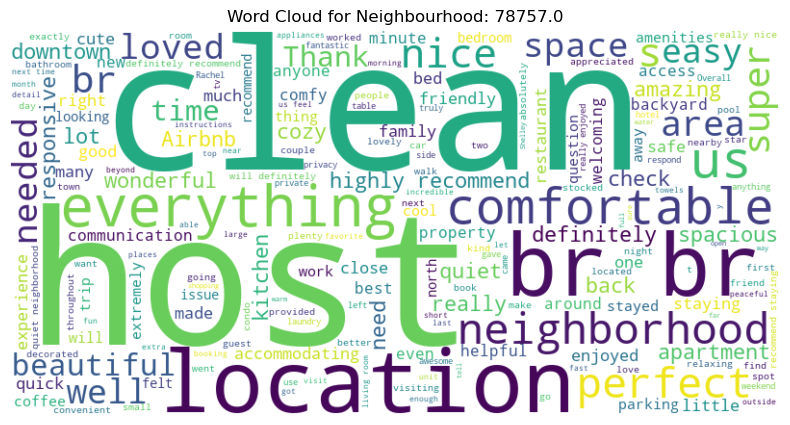

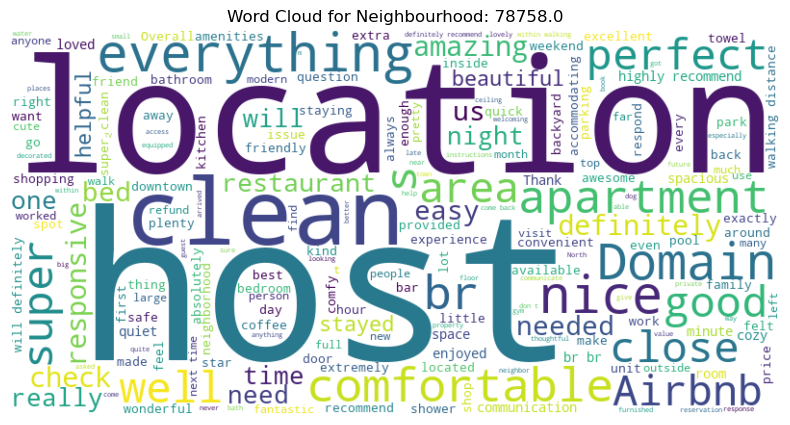

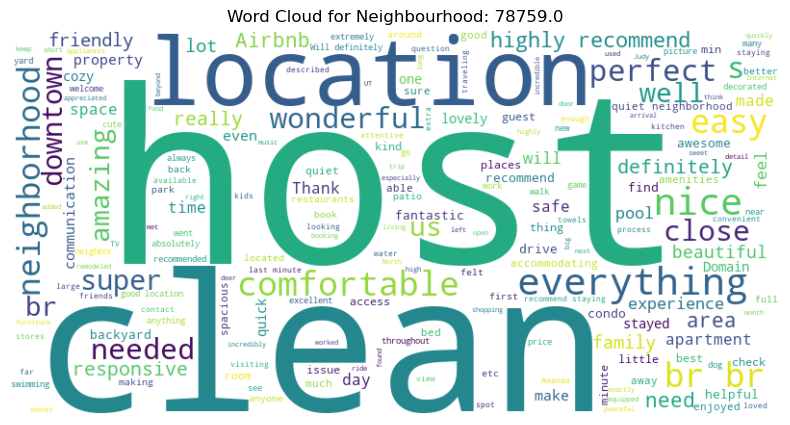

In [59]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re

# Define the words to exclude from the word cloud
exclude_words = ['stay', 'place', 'house', 'Austin', 'home', 'great']

# Function to remove specified words from text
def remove_words(text):
    for word in exclude_words:
        text = re.sub(r'\b' + re.escape(word) + r'\b', '', text, flags=re.IGNORECASE)
    return text

# Group the DataFrame by 'neighbourhood_cleansed' and aggregate 'comments'
comments_by_neighbourhood = df.groupby('neighbourhood_cleansed')['comments'].agg(' '.join)

# Create a word cloud for each group, excluding specified words
for neighbourhood, comments in comments_by_neighbourhood.items():
    cleaned_comments = remove_words(comments)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_comments)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Neighbourhood: {neighbourhood}')
    plt.axis('off')
    plt.show()

In [60]:
df['geo'] = df.apply(lambda row: [row['latitude'], row['longitude']], axis=1)

# 3.  Status by Host / host related 
- any difference between superhost and non-superhost?

In [61]:
df['host_is_superhost'].value_counts()

0    8456
1    5111
Name: host_is_superhost, dtype: int64

In [62]:
# Get the column names from your DataFrame
column_names = df.columns

# Create a list of column names that include 'host'
host_columns = [col for col in column_names if 'host' in col]

# Print the list of host-related column names
print(host_columns)

['host_id', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count', 'host_has_profile_pic', 'host_identity_verified', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'host_words']


In [66]:
host_corr_df = df[['host_id', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_neighbourhood', 'host_total_listings_count', 'host_has_profile_pic', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms', 'review_scores_rating', 'reviews_per_month']]

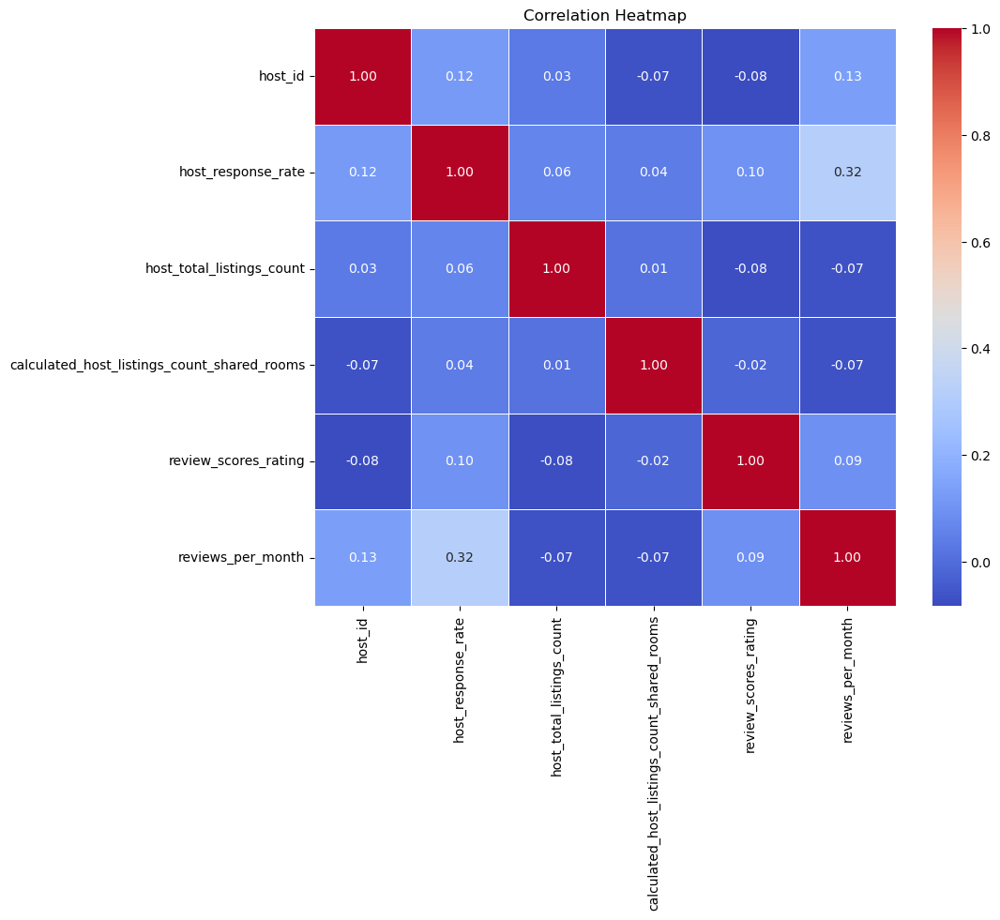

In [67]:
correlation_matrix = host_corr_df.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [68]:
host_corr_df.describe()

,host_id,host_response_rate,host_total_listings_count,calculated_host_listings_count_shared_rooms,review_scores_rating,reviews_per_month
count,1.356900e+04,13567.000000,13567.000000,13567.000000,13567.000000,13567.000000
mean,1.386720e+08,75.641114,66.025724,0.311786,4.772511,1.595258
std,1.523996e+08,41.587639,399.267675,3.868995,0.530234,1.718522
min,2.300000e+01,0.000000,1.000000,0.000000,0.000000,0.010000
25%,1.586425e+07,80.000000,1.000000,0.000000,4.750000,0.330000
50%,6.852845e+07,100.000000,3.000000,0.000000,4.930000,1.010000
75%,2.419157e+08,100.000000,14.000000,0.000000,5.000000,2.340000
max,5.174177e+08,100.000000,7977.000000,54.000000,5.000000,27.180000


<AxesSubplot:title={'center':'availability_365 by superhost'}, xlabel='host_is_superhost'>

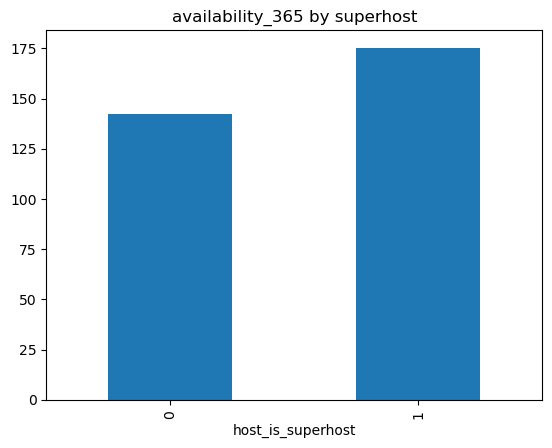

In [69]:
df.groupby(['host_is_superhost'])['availability_365'].mean().plot(kind='bar', title='availability_365 by superhost')

/var/folders/9m/mbcz94nd0x56sh8gf16ky2680000gn/T/ipykernel_22337/2503689225.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(['host_is_superhost'])['host_response_rate','host_acceptance_rate'].mean().plot(kind='bar', title='host response, acceptance rate by suerhost or not')


<AxesSubplot:title={'center':'host response, acceptance rate by suerhost or not'}, xlabel='host_is_superhost'>

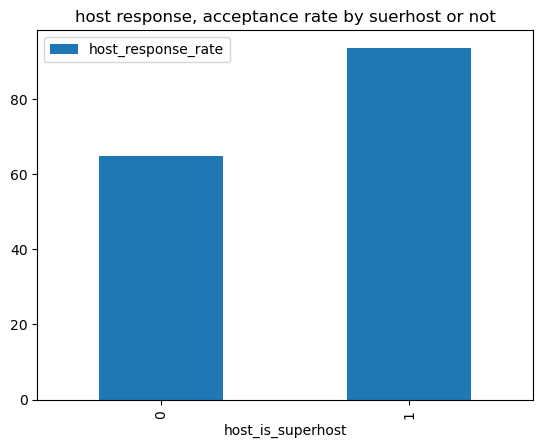

In [70]:
df.groupby(['host_is_superhost'])['host_response_rate','host_acceptance_rate'].mean().plot(kind='bar', title='host response, acceptance rate by suerhost or not')

<AxesSubplot:xlabel='host_is_superhost'>

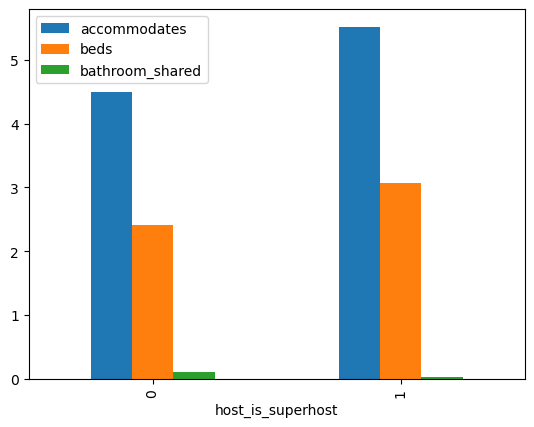

In [71]:
df.groupby('host_is_superhost')[['accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'bathroom_shared']].mean().plot(kind='bar')

/var/folders/9m/mbcz94nd0x56sh8gf16ky2680000gn/T/ipykernel_22337/2786664850.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  host_corr_df.groupby('host_is_superhost')['host_total_listings_count','calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms' ].mean().plot(kind='bar', title='host upload activities by superhost or not')


<AxesSubplot:title={'center':'host upload activities by superhost or not'}, xlabel='host_is_superhost'>

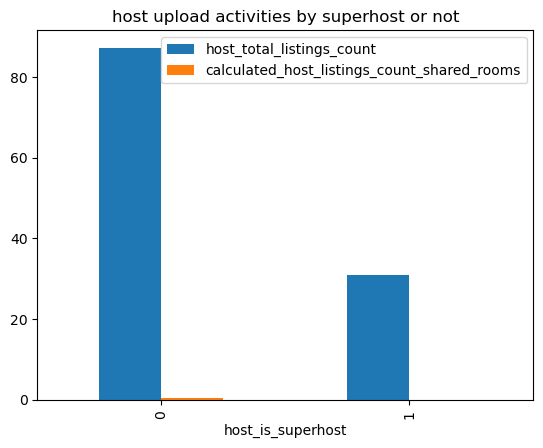

In [72]:
host_corr_df.groupby('host_is_superhost')['host_total_listings_count','calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms' ].mean().plot(kind='bar', title='host upload activities by superhost or not')

In [73]:
df['host_has_profile_pic'] = df['host_has_profile_pic'].replace('No info entered', 0)
df['host_has_profile_pic'] = df['host_has_profile_pic'].replace('t', 1).replace('f', 0)
df['host_has_profile_pic'].value_counts()

1.0    13475
0.0       92
Name: host_has_profile_pic, dtype: int64

In [74]:
df['host_identity_verified'] = df['host_identity_verified'].replace('No info entered', 0)

<AxesSubplot:title={'center':'host profile pic & identity verification activities by superhost or not'}, xlabel='host_is_superhost'>

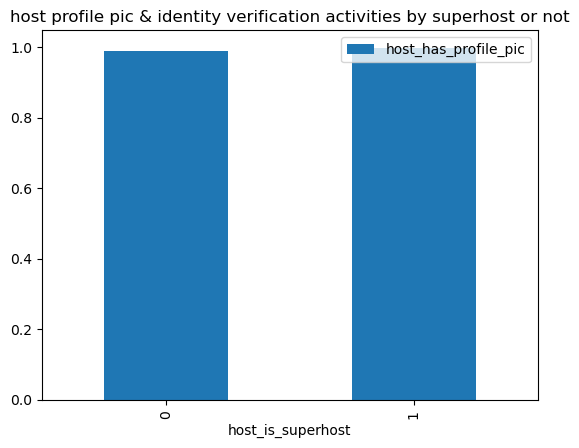

In [75]:
df.groupby('host_is_superhost')[['host_has_profile_pic','host_identity_verified']].mean().plot(kind='bar', title='host profile pic & identity verification activities by superhost or not')

<AxesSubplot:title={'center':'average rating and number of reviews per month'}, xlabel='host_is_superhost'>

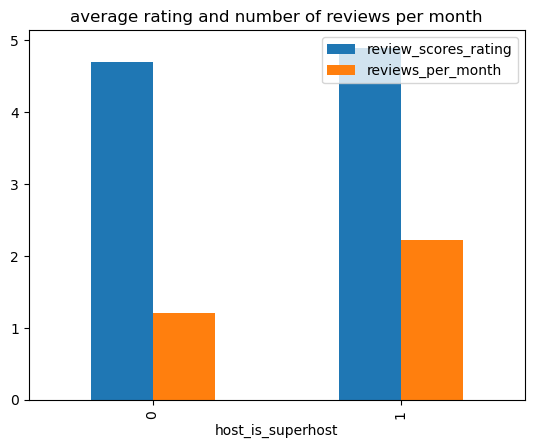

In [76]:
df.groupby('host_is_superhost')[['review_scores_rating', 'reviews_per_month']].mean().plot(kind='bar', title='average rating and number of reviews per month')

<AxesSubplot:title={'center':'std of rating and number of reviews per month'}, xlabel='host_is_superhost'>

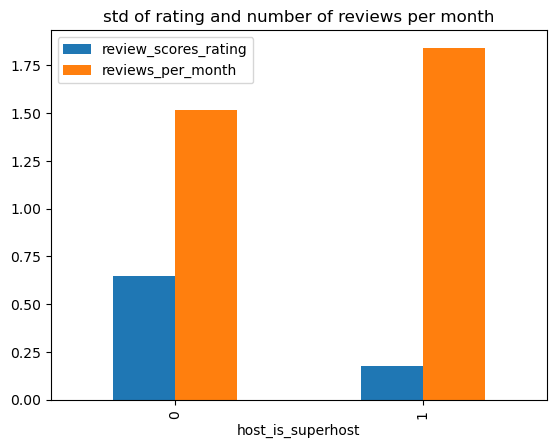

In [77]:
df.groupby('host_is_superhost')[['review_scores_rating', 'reviews_per_month']].std().plot(kind='bar', title='std of rating and number of reviews per month')

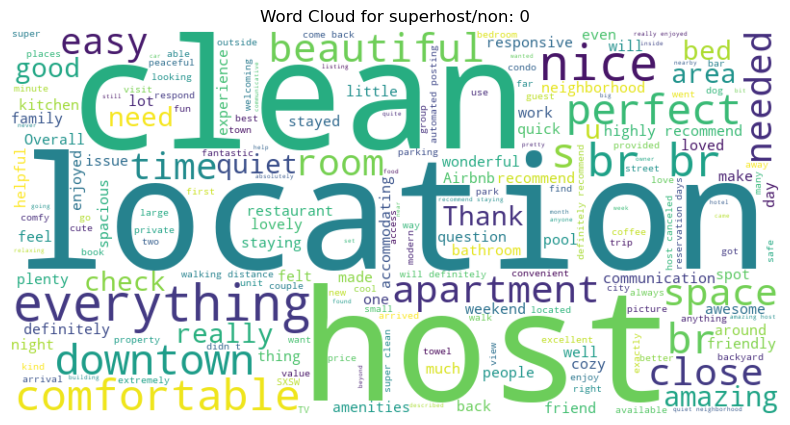

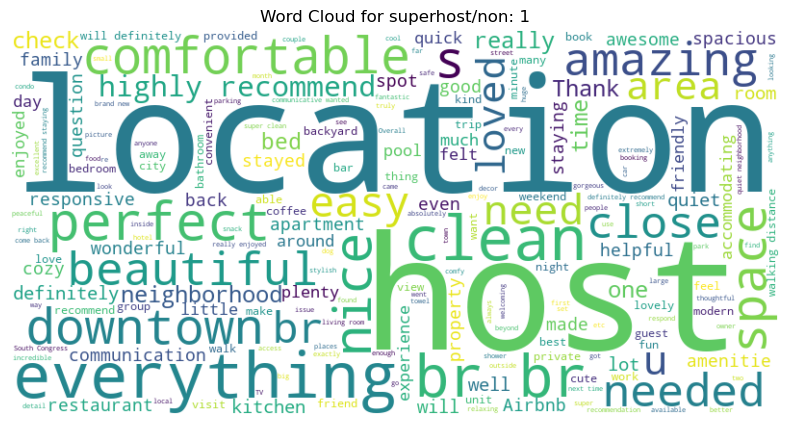

In [80]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re

# Define the words to exclude from the word cloud
exclude_words = ['stay', 'place', 'house', 'Austin', 'home', 'great']

# Function to remove specified words from text
def remove_words(text):
    for word in exclude_words:
        text = re.sub(r'\b' + re.escape(word) + r'\b', '', text, flags=re.IGNORECASE)
    return text

# Group the DataFrame by 'neighbourhood_cleansed' and aggregate 'comments'
comments_by_neighbourhood = df.groupby('host_is_superhost')['comments'].agg(' '.join)

# Create a word cloud for each group, excluding specified words
for neighbourhood, comments in comments_by_neighbourhood.items():
    cleaned_comments = remove_words(comments)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_comments)
    
    # Plot the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for superhost/non: {neighbourhood}')
    plt.axis('off')
    plt.show()

# 4. by PriceRange

/var/folders/9m/mbcz94nd0x56sh8gf16ky2680000gn/T/ipykernel_22337/1574563127.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby('price_range')['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication','review_scores_location', 'review_scores_value'].mean().plot(kind='bar', title='detailed ratings per price range')


<AxesSubplot:title={'center':'detailed ratings per price range'}, xlabel='price_range'>

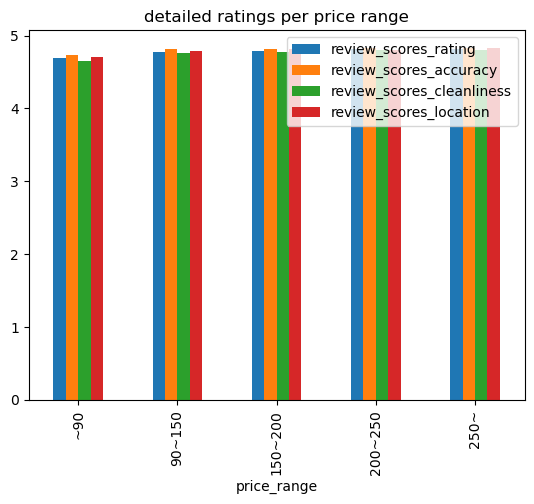

In [81]:
df.groupby('price_range')['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication','review_scores_location', 'review_scores_value'].mean().plot(kind='bar', title='detailed ratings per price range')

<AxesSubplot:title={'center':'detailed ratings per price range'}, xlabel='price_range'>

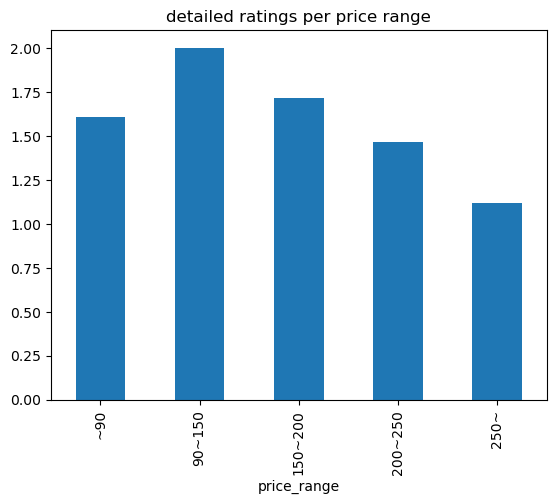

In [82]:
df.groupby('price_range')['reviews_per_month'].mean().plot(kind='bar', title='detailed ratings per price range')

<AxesSubplot:xlabel='price_range'>

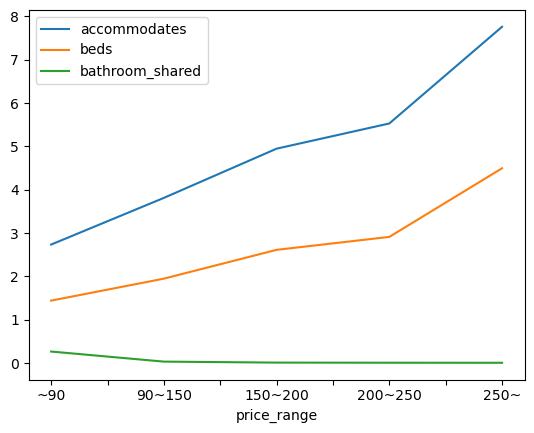

In [83]:
df.groupby('price_range')[['accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'bathroom_shared']].mean().plot()

<AxesSubplot:xlabel='neighbourhood_cleansed,price_range'>

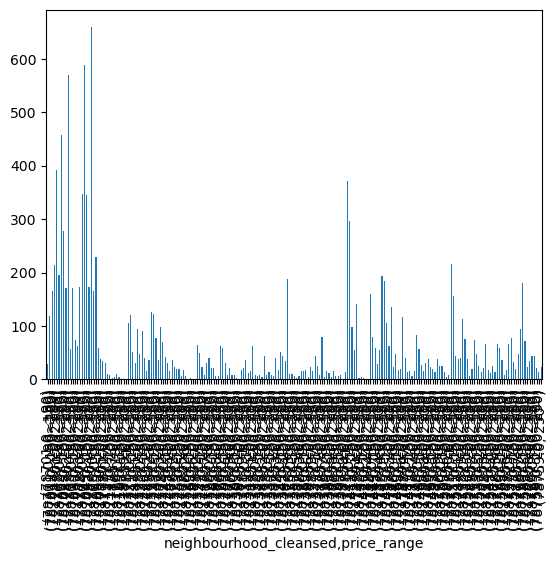

In [84]:
df.groupby(['neighbourhood_cleansed','price_range'])['price'].count().plot(kind='bar')